# K Nearest Neighbor & the Iris Dataset

The following notebook is a combination of the gaussian naive bayes classifier, as well as the knn classifier. All credit to the original authors.   

Your job is to fill in the missing code-blocks and analyze the outputs that your code produces.  
   
Credit to the author of this [netlify app](https://knn-notebook.netlify.app/) for knn notebook.  

Credit to [xavierbourretsicotte](https://www.kaggle.com/prashant111) for the gaussian naive bayes notebook.  

Modifications to instructions and code are indicated via a note from me: (*Note*: ...)  

In [69]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, classification_report

import matplotlib.colors as colors
from sklearn.naive_bayes import GaussianNB

from scipy.stats import loguniform
from sklearn.model_selection import RandomizedSearchCV

In [32]:
# Load in iris dataset
data = _ _ _

## Naive Bayes

In this short notebook, we will re-use the Iris dataset example and implement instead a Gaussian Naive Bayes classifier using pandas, numpy and scipy.stats libraries. Results are then compared to the Sklearn implementation as a sanity check. (*Note*: We will only be using the sklearn library)  
 
Note that the parameter estimates are obtained using built-in pandas functions, which greatly simplify the implementation, but may lead to slightly different results due to the way variances and covariances are calculated. (i.e. with or without bias correction)  
Sometimes other measures can be more suitable for a given setting and include the Manhattan, Chebyshev and Hamming distance.    

## Theory and background

This is a technique that has remained popular over the years, despite its name. It is especially appropriate when the dimension p of the feature space is high, making density estimation unattractive. The naive Bayes model assumes that given a class label, the features are independent.  

While this assumption is generally not true, it simplifies the estimation dramatically:  

* The individual class-conditional marginal densities can be estimated separately  
* If a component is discrete, an appropriate histogram estimate can be used. This provides a way of mixing variable types in a feature vector  

## Original idea: the Bayes classifier

The Bayes classifier aims to estimate p(y|x) using:  

![image](https://github.com/The-Knowledge-House/DS_22/assets/26397102/48ed6ef2-8910-4014-8b51-d3ac07833cf1)

This can be estimated using the MLE method, assuming y is discrete:  

![image](https://github.com/The-Knowledge-House/DS_22/assets/26397102/ebbbbc92-3fd1-402f-bcf2-c06bc9ea536f)

However, there is a big problem with this method. The MLE estimate is only good if there are many training vectors with the same identical features as x. In high dimensional spaces or with continuous x this never happens and the numerator and denominator both tend to zero.  

## Naive Assumption

To get around this issue, we make use of a naive assumption and the Bayes trick. These turn out to be powerful ones.  

Use Bayes rule to rewrite the equation and recall that estimating p(y) and p(x|y) is called generative learning.  

![image](https://github.com/The-Knowledge-House/DS_22/assets/26397102/f56c6ffc-6213-4044-b5b7-6c8a1bcab472)

Estimating p(y) is easy, if Y takes on discrete binary values, we simply need to count how many times we observe each class  

![image](https://github.com/The-Knowledge-House/DS_22/assets/26397102/775c64e8-598e-4a52-84a9-c228632f74d0)

Estimating p(x|y) is not easy, and requires the naive assumption that feature values are independent given the label. This is a very bold assumption, as is illustrated by the following example.  

Imagine that we are building a Naive Bayes spam classifier, where the data are words in an email and the labels are spam vs not spam. The Naive Bayes assumption implies that words in an email are conditionally independent given that we know that an email is spam or not spam. Mathematically, if x is an element of R^p we get:  

![image](https://github.com/The-Knowledge-House/DS_22/assets/26397102/76e670d0-bdcb-4edf-84f1-3c79164dbe2d)

As usual, the Bayes Classifier will predict the class for which the posterior probability is the greatest:  

![image](https://github.com/The-Knowledge-House/DS_22/assets/26397102/56e34663-634b-4eb2-9f5b-74b8f77e5486)

Note that we don't actually need to compute the probability, but can instead maximize the objective of the last two lines of the equation above as these will be proportional to the posterior probability. This makes it easier to calculate as p(x) may not be known.  

Now that we have an objective function, we can use it to make estimations of p(y|x) based on three different probabilistic assumptions which will depend on the structure of the problem and the dataset.  

## Continuous Features

When feature x∈R take on real values, we can use a Gaussian distribution where we assume that each feature α comes from a class-conditional, univariate Gaussian distribution. Other specifications can be used.

## An example in 2D using the Iris data set

Let's consider a simple example using the Iris data set:

There are 3 class labels: Setosa, Versicolor, Virginica which we label as y∈{0,1,2}
There are two explanatory variables (features): 
* X1: sepal length and
* X2: sepal width.

For each feature, we calculate the estimated class mean, class variance and prior probability

![image](https://github.com/The-Knowledge-House/DS_22/assets/26397102/5b0c132b-0600-4b77-aad5-74da447b7eee)

For any point (x1,x2) we compute the Gaussian Naive Bayes objective function (i.e. the one we are trying to maximize) for each class :

![image](https://github.com/The-Knowledge-House/DS_22/assets/26397102/41a042df-bd44-4a9b-8295-adaf422119fb)

Where the "phi" function is the PDF of a Gaussian univariate distribution with parameters (mean, variance). Repeat this calculation for each class, and then predict the class which has the highest value.

In [ ]:
#perform simple data transformations

# rename the columns of your dataframe
data = _ _ _.rename(index = str, columns = {'sepal.length':'1_sepal_length','sepal.width':'2_sepal_width', 'petal.length':'3_petal_length', 'petal.width':'4_petal_width'})

c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


Text(0.5, 1.0, 'Scatter plot')

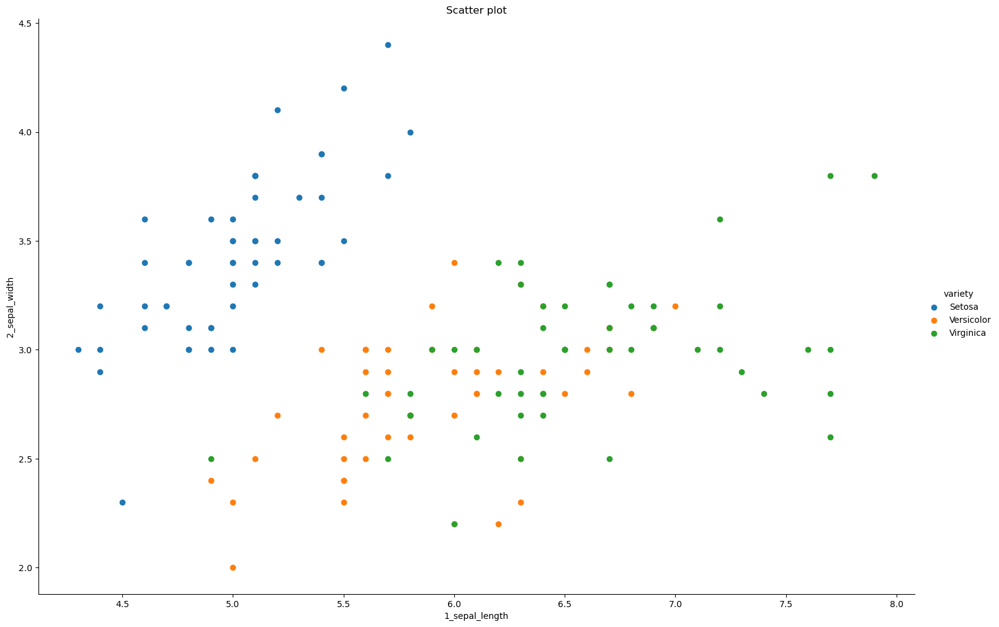

In [48]:
#Plot the scatter of sepal length vs sepal width
sns.FacetGrid(data, hue="variety", height=10, aspect=1.5).map(plt.scatter,"1_sepal_length", "2_sepal_width", ).add_legend()
plt.title('Scatter plot')

In [ ]:
# create a new dataframe that contain only 3 columns: "1_sepal_length", "2_sepal_width",'variety'
df1 = data[["_ _ _", "_ _ _","_ _ _"]]

In [40]:
#Setup X and y data

# select first 2 columns for X
X_data = df1.iloc[:,0:2]

# select "variety" column for "y", and replace all Setosa, Versicolor, and Virginica encodings with 0,1, and 2 respectively
y_labels = df1.iloc[:,2].replace({'_ _ _':0,'_ _ _':1,'_ _ _':2}).copy()

In [41]:
# create and fit your model

model_sk = GaussianNB()

#Fit a Gaussian Naive Bayes model using X_date and y_labels
model_sk.fit(_ _ _, _ _ _)

GaussianNB()

c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWar

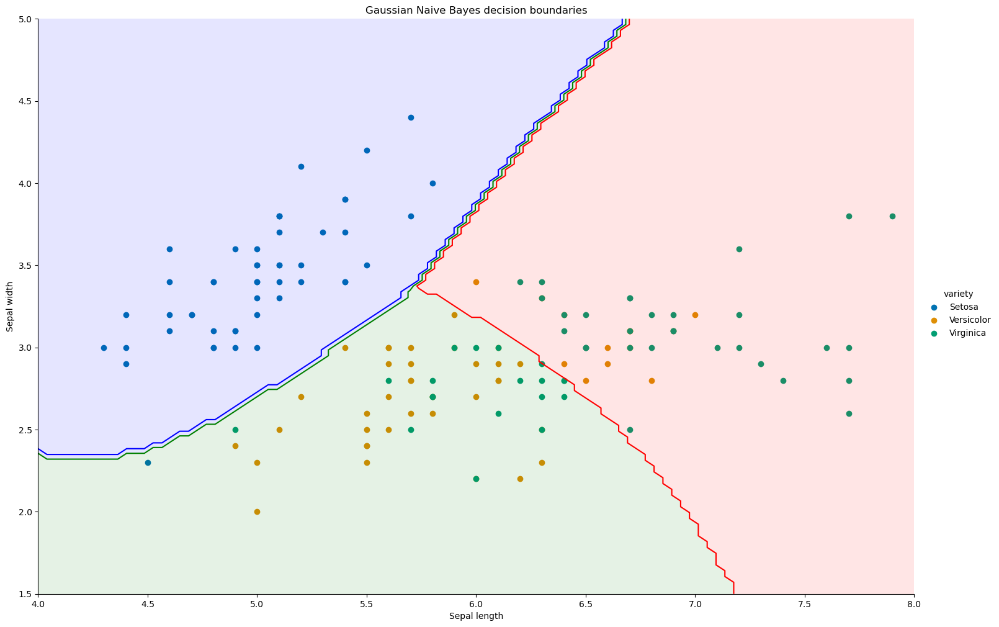

In [47]:
# Set parameters for decision boundary plot
N = 100
X = np.linspace(4, 8, N)
Y = np.linspace(1.5, 5, N)
X, Y = np.meshgrid(X, Y)

color_list = ['Blues','Greens','Reds']
my_norm = colors.Normalize(vmin=-1.,vmax=1.)

g = sns.FacetGrid(data, hue="variety", height=10, aspect=1.5, palette = 'colorblind') .map(plt.scatter, "1_sepal_length", "2_sepal_width",).add_legend()
my_ax = g.ax


#Computing the predicted class function for each value on the grid
zz = np.array(  [model_sk.predict( [[xx,yy]])[0] for xx, yy in zip(np.ravel(X), np.ravel(Y)) ] )


#Reshaping the predicted class into the meshgrid shape
Z = zz.reshape(X.shape)


#Plot the filled and boundary contours
my_ax.contourf( X, Y, Z, 2, alpha = .1, colors = ('blue','green','red'))
my_ax.contour( X, Y, Z, 2, alpha = 1, colors = ('blue','green','red'))

# Addd axis and title
my_ax.set_xlabel('Sepal length')
my_ax.set_ylabel('Sepal width')
my_ax.set_title('Gaussian Naive Bayes decision boundaries')

plt.show()

## Measures of Accuracy

(Note: Let's view the confusion matrix for this default GaussianNB model, as well as the respective accuracy and recall measures. This will be used for comparison purposes for other GaussianNB models, as well as the kNN model.)

In [64]:
# create predictions on our `X_data`
y_hat = model_sk.predict(_ _ _)

labels = y_labels.unique()

# create the corresponding confusion matrix 
matrix = confusion_matrix(y_labels, y_hat, labels=labels, normalize=None)
matrix

array([[49,  1,  0],
       [ 0, 37, 13],
       [ 0, 19, 31]], dtype=int64)

In [66]:
# let's contextualize this confusion matrix via the "classification_report" method which provides different metrics used to view performance of our classifiers
print("Setosa = 0, Versicolor = 1, and Virginica = 2")

print(classification_report(y_labels, y_hat, labels=labels))

Setosa = 0, Versicolor = 1, and Virginica = 2
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        50
           1       0.65      0.74      0.69        50
           2       0.70      0.62      0.66        50

    accuracy                           0.78       150
   macro avg       0.78      0.78      0.78       150
weighted avg       0.78      0.78      0.78       150



## Tuning Var_Smoothing

(Note: As we've established, it's up to use to find optimal hyperparameters for best performance. Let's utilize RandomizedSearchCV to find the optimal smoothing parameter for our Naive Bayes model)

In [70]:
# create a search space for our var_smoothing param 
param_dist = {'var_smoothing': loguniform(1e-9, 1e-3)}

# create randomized search object
random_search = RandomizedSearchCV(model_sk, param_distributions=param_dist, n_iter=100, cv=5, verbose=1, random_state=42)

# search for the optimal hyperparam
random_search.fit(X_data, y_labels)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


RandomizedSearchCV(cv=5, estimator=GaussianNB(), n_iter=100,
                   param_distributions={'var_smoothing': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x000001F1212123D0>},
                   random_state=42, verbose=1)

In [71]:
# view the best hyperparam and corresponding cv accuracy score

print("Best parameters found: ", random_search.best_params_)
print("Best cross-validated score: ", random_search.best_score_)

Best parameters found:  {'var_smoothing': 1.767016940294796e-07}
Best cross-validated score:  0.7933333333333332


In [75]:
# create a GaussianNB classifier with this hyperparam
model_sk_tuned = GaussianNB(var_smoothing=random_search.best_params_["var_smoothing"])

# fit the model with your corresponding 'X_data' and 'y_labels' datasets
model_sk_tuned.fit(_ _ _, _ _ _)

GaussianNB(var_smoothing=1.767016940294796e-07)

c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWar

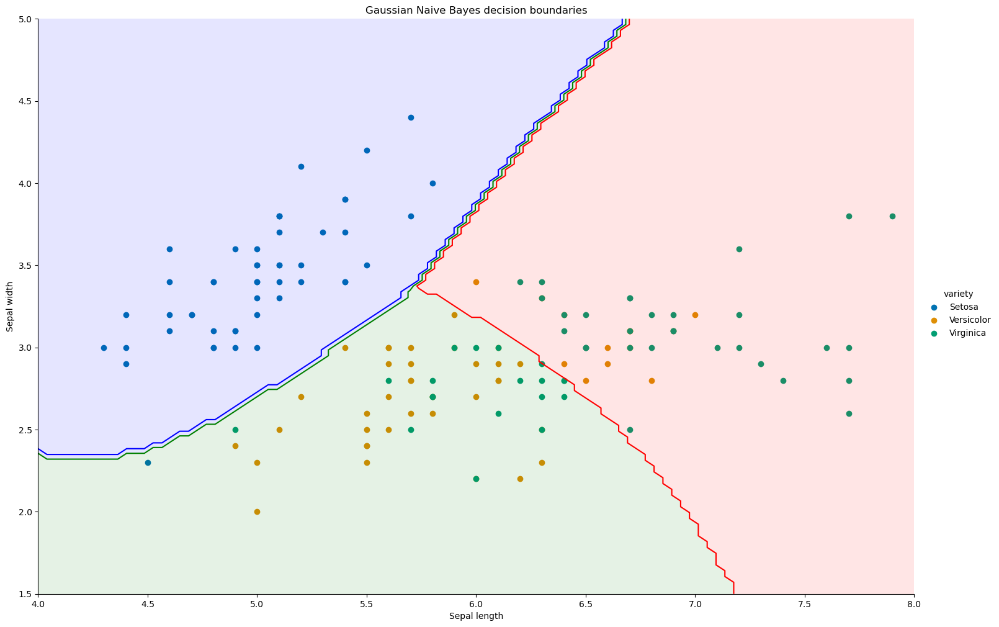

In [76]:
# let's view the corresponding decision boundary created by this discovered tuning param

g = sns.FacetGrid(data, hue="variety", height=10, aspect=1.5, palette = 'colorblind') .map(plt.scatter, "1_sepal_length", "2_sepal_width",).add_legend()
my_ax = g.ax


#Computing the predicted class function for each value on the grid
zz = np.array(  [model_sk_tuned.predict( [[xx,yy]])[0] for xx, yy in zip(np.ravel(X), np.ravel(Y)) ] )


#Reshaping the predicted class into the meshgrid shape
Z = zz.reshape(X.shape)


#Plot the filled and boundary contours
my_ax.contourf( X, Y, Z, 2, alpha = .1, colors = ('blue','green','red'))
my_ax.contour( X, Y, Z, 2, alpha = 1, colors = ('blue','green','red'))

# Addd axis and title
my_ax.set_xlabel('Sepal length')
my_ax.set_ylabel('Sepal width')
my_ax.set_title('kNN=5 decision boundaries')

plt.show()


## kNN 

In the reading notebook, we implemented k-Nearest Neighbor(KNN) on the Fisher's iris dataset, where the task was to predict which class an unidentified iris plant belongs based on the sepal and petal measurements. This notebook is a clean version for the same problem containing only the codes for the complete machine learning pipeline of KNN.

(*Note*:This refers to a seperate reading task which we will not look at. Instead, let's focus in on the sklearn code that allows us to create the kNN model)

c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype

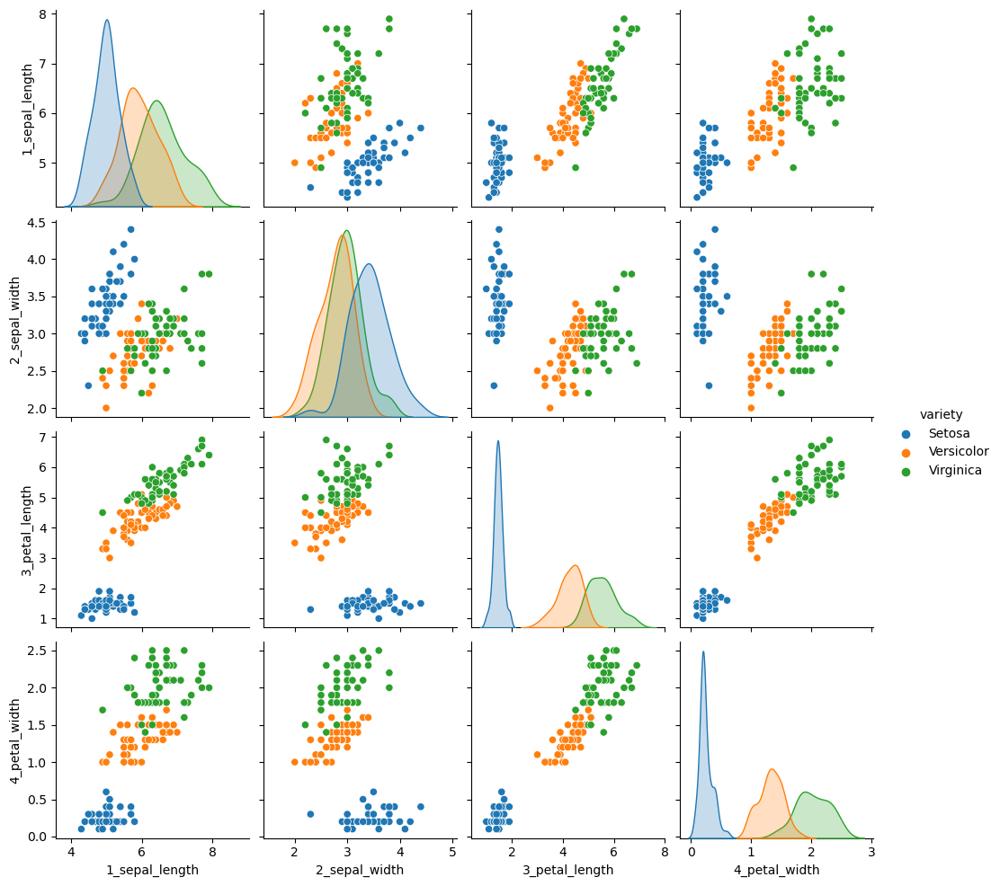

In [49]:
# view pairplot once more to review clusters

# run this pairplot on the original "data" dataset, varying the hue by "variety"
sns.pairplot(data, hue='_ _ _')

## kNN Model 1

To start with, we are going to build a KNN model with Sepal Length & Sepal Width. We will train the model with these two features and evaluate how it performed using the classification map and the confusion matrix.

In [50]:
# create the kNN object with 5 neighours (default)
model_1 = KNeighborsClassifier(n_neighbors=5)

# fit a model with the already created "X_data" and "y_labels"
model_1.fit(_ _ _, _ _ _)

KNeighborsClassifier()

c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\

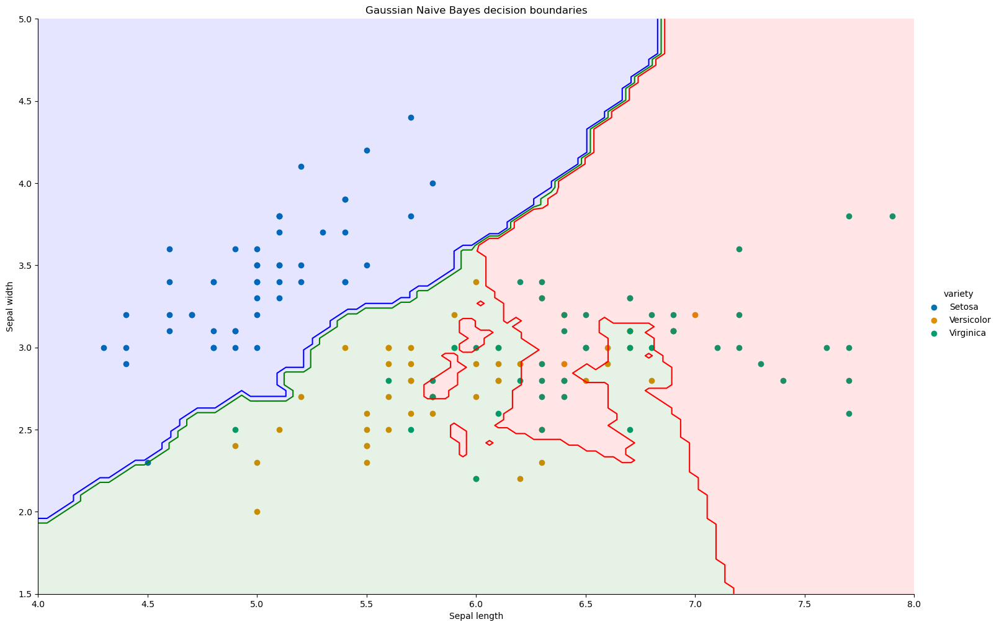

In [72]:
# view the created decision boundary
g = sns.FacetGrid(data, hue="variety", height=10, aspect=1.5, palette = 'colorblind') .map(plt.scatter, "1_sepal_length", "2_sepal_width",).add_legend()
my_ax = g.ax


#Computing the predicted class function for each value on the grid
zz = np.array(  [model_1.predict( [[xx,yy]])[0] for xx, yy in zip(np.ravel(X), np.ravel(Y)) ] )


#Reshaping the predicted class into the meshgrid shape
Z = zz.reshape(X.shape)


#Plot the filled and boundary contours
my_ax.contourf( X, Y, Z, 2, alpha = .1, colors = ('blue','green','red'))
my_ax.contour( X, Y, Z, 2, alpha = 1, colors = ('blue','green','red'))

# Addd axis and title
my_ax.set_xlabel('Sepal length')
my_ax.set_ylabel('Sepal width')
my_ax.set_title('Gaussian Naive Bayes decision boundaries')

plt.show()

# what do you notice is different about these decision boundaries?

## Measures of Accuracy 1

(Note: Let's view the confusion matrix for this default kNN model, as well as the respective accuracy and recall measures. As before, this will be used for comparison purposes.)

In [79]:
# create predictions on our `X_data`
y_hat = model_1.predict(_ _ _)

# we then view the various measures of accuracy of our default kNN model
print("Setosa = 0, Versicolor = 1, and Virginica = 2")

# compare the real data "y_labels" to our predicted data "y_hat"
print(classification_report(y_labels, _ _ _, labels=labels))

Setosa = 0, Versicolor = 1, and Virginica = 2
              precision    recall  f1-score   support

           0       1.00      0.98      0.99        50
           1       0.75      0.76      0.75        50
           2       0.76      0.76      0.76        50

    accuracy                           0.83       150
   macro avg       0.84      0.83      0.83       150
weighted avg       0.84      0.83      0.83       150



## Tuning k 1

(Note: As we've established, it's up to use to find optimal hyperparameters for best performance. Let's utilize RandomizedSearchCV to find the optimal number of neighbors for our kNN algo.)

In [90]:
# create a search space for our var_smoothing param 
param_dist_k = {'n_neighbors': np.arange(1, 31)}

# create randomized search object
search_knn = RandomizedSearchCV(model_1, param_distributions=param_dist_k, n_iter=20, cv=5, verbose=1, random_state=42)

# search for the optimal hyperparam
search_knn.fit(X_data, y_labels)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


RandomizedSearchCV(cv=5, estimator=KNeighborsClassifier(), n_iter=20,
                   param_distributions={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30])},
                   random_state=42, verbose=1)

In [91]:
# view the best hyperparam and corresponding cv accuracy score

print("Best 'k' found: ", search_knn.best_params_)
print("Best cross-validated score: ", search_knn.best_score_)

Best 'k' found:  {'n_neighbors': 17}
Best cross-validated score:  0.82


In [92]:
# create a KNeighborsClassifier classifier with this selected k
model_1_tuned = KNeighborsClassifier(n_neighbors=search_knn.best_params_["n_neighbors"])

# fit the model with your corresponding 'X_data' and 'y_labels' datasets
model_1_tuned.fit(X_data, y_labels)

KNeighborsClassifier(n_neighbors=17)

c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\

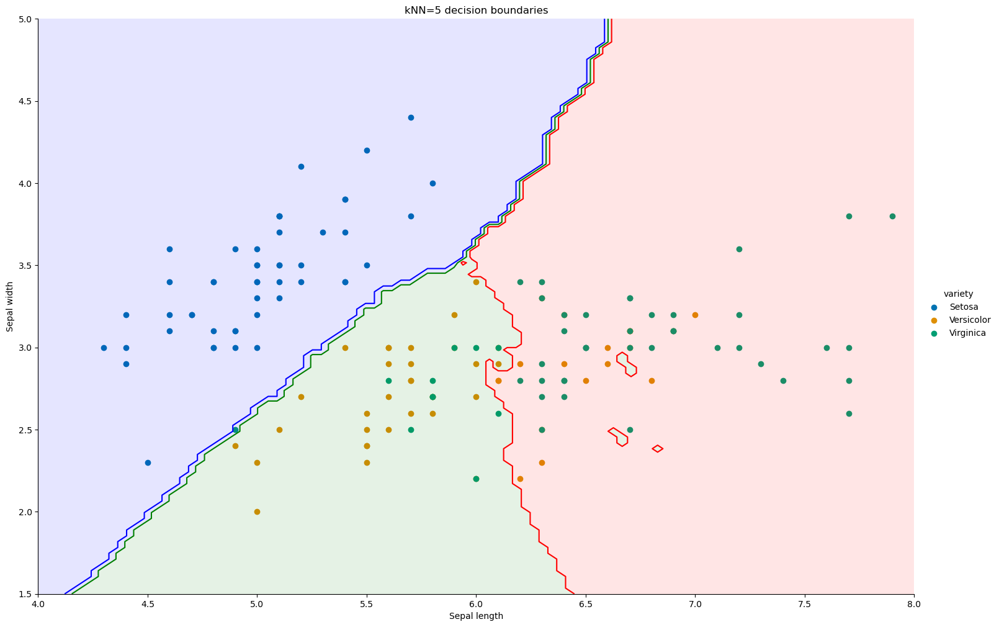

In [94]:
N = 100
X = np.linspace(4, 8, N)
Y = np.linspace(1.5, 5, N)
X, Y = np.meshgrid(X, Y)

# let's view the corresponding decision boundary created by this discovered tuning param

g = sns.FacetGrid(data, hue="variety", height=10, aspect=1.5, palette = 'colorblind') .map(plt.scatter, "1_sepal_length", "2_sepal_width",).add_legend()
my_ax = g.ax


#Computing the predicted class function for each value on the grid
zz = np.array(  [model_1_tuned.predict( [[xx,yy]])[0] for xx, yy in zip(np.ravel(X), np.ravel(Y)) ] )


#Reshaping the predicted class into the meshgrid shape
Z = zz.reshape(X.shape)


#Plot the filled and boundary contours
my_ax.contourf( X, Y, Z, 2, alpha = .1, colors = ('blue','green','red'))
my_ax.contour( X, Y, Z, 2, alpha = 1, colors = ('blue','green','red'))

# Addd axis and title
my_ax.set_xlabel('Sepal length')
my_ax.set_ylabel('Sepal width')
my_ax.set_title('kNN=17 decision boundaries')

plt.show()


## kNN Model 2

Just for fun, let's see what happens to our decision boundaries when we use "too many" neighbors.

In [100]:
# create a KNeighborsClassifier classifier with 100 neighbors
model_toomanyk = KNeighborsClassifier(n_neighbors=100)

# fit the model with your corresponding 'X_data' and 'y_labels' datasets
model_toomanyk.fit(X_data, y_labels)

KNeighborsClassifier(n_neighbors=100)

c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Us

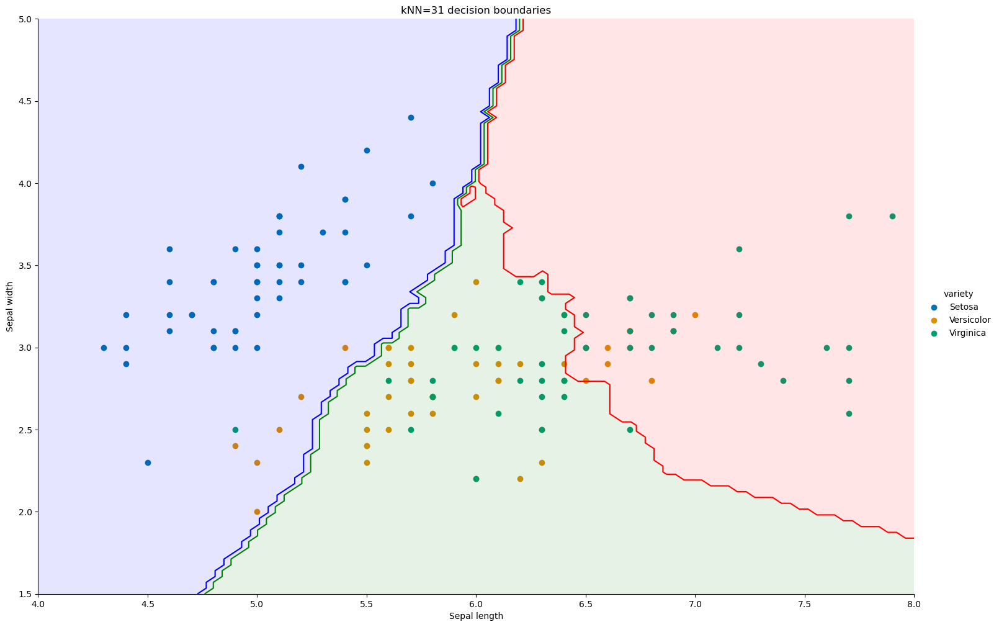

In [101]:
# NOTE: This code might take a while to run. Keep in mind that kNN algorithms are computationally expensive (in certain contexts when we consider too many neighbors, or we have a lot of data sample)

N = 100
X = np.linspace(4, 8, N)
Y = np.linspace(1.5, 5, N)
X, Y = np.meshgrid(X, Y)

# let's view the corresponding decision boundary created by this discovered tuning param

g = sns.FacetGrid(data, hue="variety", height=10, aspect=1.5, palette = 'colorblind') .map(plt.scatter, "1_sepal_length", "2_sepal_width",).add_legend()
my_ax = g.ax


#Computing the predicted class function for each value on the grid
zz = np.array(  [model_toomanyk.predict( [[xx,yy]])[0] for xx, yy in zip(np.ravel(X), np.ravel(Y)) ] )


#Reshaping the predicted class into the meshgrid shape
Z = zz.reshape(X.shape)


#Plot the filled and boundary contours
my_ax.contourf( X, Y, Z, 2, alpha = .1, colors = ('blue','green','red'))
my_ax.contour( X, Y, Z, 2, alpha = 1, colors = ('blue','green','red'))

# Addd axis and title
my_ax.set_xlabel('Sepal length')
my_ax.set_ylabel('Sepal width')
my_ax.set_title('kNN=31 decision boundaries')

plt.show()


In [102]:
# create predictions on our `X_data` using the 'model_toomanyk' kNN model
y_hat = _ _ _.predict(_ _ _)

# we then view the various measures of accuracy of our default kNN model
print("Setosa = 0, Versicolor = 1, and Virginica = 2")

# compare the real data "y_labels" to our predicted data "y_hat"
print(classification_report(y_labels, _ _ _, labels=labels))

Setosa = 0, Versicolor = 1, and Virginica = 2
              precision    recall  f1-score   support

           0       0.88      1.00      0.93        50
           1       0.59      0.70      0.64        50
           2       0.74      0.50      0.60        50

    accuracy                           0.73       150
   macro avg       0.74      0.73      0.72       150
weighted avg       0.74      0.73      0.72       150



## kNN Model 3

Now for our second model, we are going to use the Petal length and petal width features as an input. (*Note*: This additional model will highlight the importance of choosing the correct features.)

In [83]:
# create a new dataframe that contain only 2 columns: "3_petal_length", "4_petal_width" for our new subset oftraining data
X_data2 = data[["_ _ _", "_ _ _"]]

In [84]:
# create the kNN object with 5 neighours (default)
model_2 = KNeighborsClassifier(n_neighbors=5)

# fit a model with the created "X_data2" and "y_labels"
model_2.fit(X_data2, y_labels)

KNeighborsClassifier()

c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
c:\Users\saidmf\anaconda3\envs\phase1\lib\site-packages\sklearn\

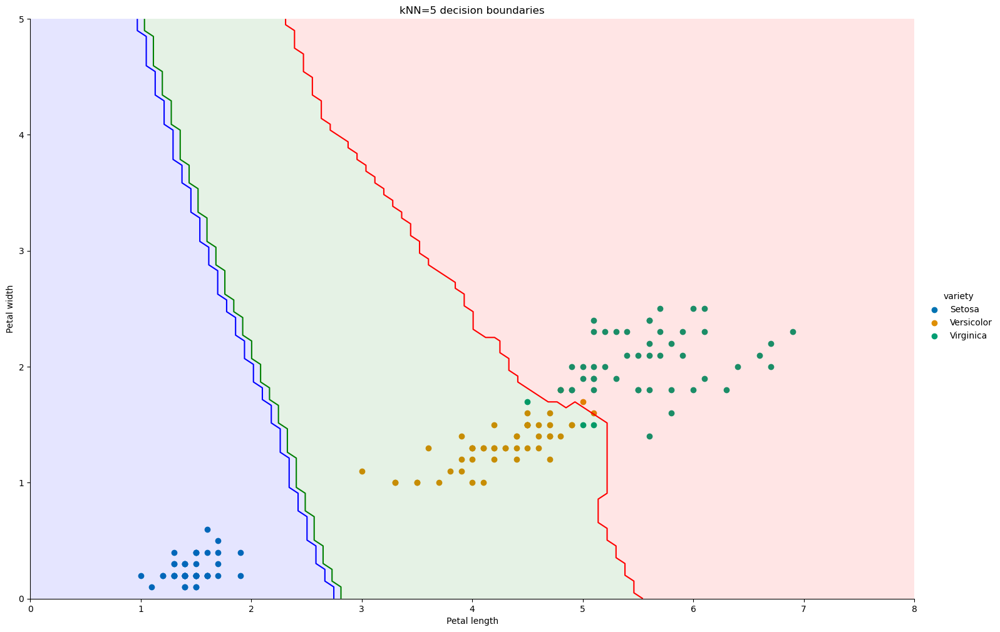

In [87]:
# Set parameters for decision boundary plot
N = 100
X = np.linspace(0, 8, N)
Y = np.linspace(0, 5, N)
X, Y = np.meshgrid(X, Y)

# view the created decision boundary for this new model
g = sns.FacetGrid(data, hue="variety", height=10, aspect=1.5, palette = 'colorblind') .map(plt.scatter, "3_petal_length", "4_petal_width",).add_legend()
my_ax = g.ax


#Computing the predicted class function for each value on the grid
zz = np.array(  [model_2.predict( [[xx,yy]])[0] for xx, yy in zip(np.ravel(X), np.ravel(Y)) ] )


#Reshaping the predicted class into the meshgrid shape
Z = zz.reshape(X.shape)


#Plot the filled and boundary contours
my_ax.contourf( X, Y, Z, 2, alpha = .1, colors = ('blue','green','red'))
my_ax.contour( X, Y, Z, 2, alpha = 1, colors = ('blue','green','red'))

# Addd axis and title
my_ax.set_xlabel('Petal length')
my_ax.set_ylabel('Petal width')
my_ax.set_title('kNN=5 decision boundaries')

plt.show()

## Measures of Accuracy 3

(Note: Let's view the confusion matrix for this default kNN model, as well as the respective accuracy and recall measures. As before, this will be used for comparison purposes.)

In [89]:
# create predictions on our `X_data2`
y_hat = _ _ _.predict(_ _ _)

# we then view the various measures of accuracy of our default kNN model
print("Setosa = 0, Versicolor = 1, and Virginica = 2")

# compare the real data "y_labels" to our predicted data "y_hat" using the "classification_report" method
print(_ _ _ (y_labels, _ _ _, labels=labels))

# what do you notice about the measures of accuracy for petal_length and petal_width?

Setosa = 0, Versicolor = 1, and Virginica = 2
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        50
           1       0.94      0.94      0.94        50
           2       0.94      0.94      0.94        50

    accuracy                           0.96       150
   macro avg       0.96      0.96      0.96       150
weighted avg       0.96      0.96      0.96       150



## Review Questions

To conclude this exercise, answer the following self-reflective questions as a group. Place your responses below each respective markdown block.

### Q1

When we went from k=17 to k=100 in our kNN model, what occured to our accuracy? Did it increase or decrease? What occured to our decision boundaries as well?

write answer here

### Q2

Would you explain this as increased variance or increased bias?

write answer here

### Q3

When utilizing our "3_petal_length" and "4_petal_width" columns for our default kNN model of 5 neighbors, how did our accuracy change when compared to the model that only considered "1_sepal_length" and "2_sepal_width"? Did it increase or decrease?

write answer here

## Q4

When looking at our brief EDA where we created a pairplot, which graph(s) indicated that the "3_petal_length" and "4_petal_width" columns were better at signifying different classes. Make sure to describe what relationships you noticed within these graphs

write answer here